In [1]:
#!pip install nba_api
#!pip install altair
#!pip install altair_saver
#!pip install selenium

In [2]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns; sns.set(style='white')
import numpy as np
import pandas as pd
from nba_api.stats.static import teams, players
import altair as alt
from altair_saver import save as alt_save

pd.set_option('max_columns', 120)
pd.set_option('max_rows', 50)

/home/noone/.virtualenvs/env36/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
seasons = pd.read_pickle('../all_players_seasons_stats_19122020.pickle.zip', compression='zip').query('TEAM_ID != 0')
seasons['total_min_in_season'] = seasons.groupby('SEASON_ID').MIN.transform('sum')
print(seasons.shape)
seasons.head()

(24729, 28)


,PLAYER_ID,SEASON_ID,LEAGUE_ID,TEAM_ID,TEAM_ABBREVIATION,PLAYER_AGE,GP,GS,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,total_min_in_season
0,76001,1990-91,00,1610612757,POR,23.0,43,0,290,55,116,0.474,0,0,0,25,44,0.568,27,62,89,12,4,12,22,39,135,535260.0
1,76001,1991-92,00,1610612757,POR,24.0,71,1,934,178,361,0.493,0,0,0,76,101,0.752,81,179,260,30,25,16,66,132,432,535310.0
2,76001,1992-93,00,1610612749,MIL,25.0,12,0,159,26,56,0.464,0,1,0,12,16,0.75,12,25,37,10,6,4,13,24,64,535160.0
3,76001,1992-93,00,1610612738,BOS,25.0,63,52,1152,219,417,0.525,0,0,0,76,100,0.76,114,186,300,17,19,22,84,165,514,535160.0
5,76001,1993-94,00,1610612738,BOS,26.0,13,0,159,24,55,0.436,0,0,0,16,25,0.64,12,34,46,3,2,3,17,20,64,533810.0


In [4]:
info = pd.read_pickle('../last_20_seasons_players_info_20122020.pickle.zip', compression='zip')
print(info.shape)
info.head()

(1964, 32)


,PERSON_ID,FIRST_NAME,LAST_NAME,DISPLAY_FIRST_LAST,DISPLAY_LAST_COMMA_FIRST,DISPLAY_FI_LAST,PLAYER_SLUG,BIRTHDATE,SCHOOL,COUNTRY,LAST_AFFILIATION,HEIGHT,WEIGHT,SEASON_EXP,JERSEY,POSITION,ROSTERSTATUS,GAMES_PLAYED_CURRENT_SEASON_FLAG,TEAM_ID,TEAM_NAME,TEAM_ABBREVIATION,TEAM_CODE,TEAM_CITY,PLAYERCODE,FROM_YEAR,TO_YEAR,DLEAGUE_FLAG,NBA_FLAG,GAMES_PLAYED_FLAG,DRAFT_YEAR,DRAFT_ROUND,DRAFT_NUMBER
0,3,Grant,Long,Grant Long,"Long, Grant",G. Long,grant-long,1966-03-12T00:00:00,Eastern Michigan,USA,Eastern Michigan/USA,6-9,240,15,,Forward,Inactive,N,0,,,,,grant_long,1988,2002,N,Y,Y,1988,2,33
0,15,Eric,Piatkowski,Eric Piatkowski,"Piatkowski, Eric",E. Piatkowski,eric-piatkowski,1970-09-30T00:00:00,Nebraska,USA,Nebraska/USA,6-7,215,14,52,Guard-Forward,Inactive,N,1610612746,Clippers,LAC,clippers,Los Angeles,eric_piatkowski,1994,2007,N,Y,Y,1994,1,15
0,21,Greg,Anthony,Greg Anthony,"Anthony, Greg",G. Anthony,greg-anthony,1967-11-15T00:00:00,UNLV,USA,UNLV/USA,6-1,180,10,50,Guard,Inactive,N,1610612752,Knicks,NYK,knicks,New York,greg_anthony,1991,2001,N,Y,Y,1991,1,12
0,26,Luc,Longley,Luc Longley,"Longley, Luc",L. Longley,luc-longley,1969-01-19T00:00:00,New Mexico,USA,New Mexico/USA,,,9,,Center,Inactive,N,0,,,,,luc_longley,1991,2000,N,Y,Y,1991,1,7
0,28,Doug,West,Doug West,"West, Doug",D. West,doug-west,1967-05-27T00:00:00,Villanova,USA,Villanova/USA,,,11,,Guard,Inactive,N,0,,,,,doug_west,1989,2000,N,Y,Y,1989,2,38


In [5]:
info.BIRTHDATE = pd.to_datetime(info.BIRTHDATE)
info[['BIRTHDATE']].info()
info.BIRTHDATE.describe(datetime_is_numeric=True).to_frame().T

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1964 entries, 0 to 0
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   BIRTHDATE  1964 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 30.7 KB


,count,mean,min,25%,50%,75%,max
BIRTHDATE,1964,1985-03-29 17:38:44.236252800,1961-06-14,1978-11-01 12:00:00,1986-02-28 12:00:00,1992-08-31 06:00:00,2000-12-23


In [6]:
info[info.PERSON_ID.isin([201207, 100263])]

,PERSON_ID,FIRST_NAME,LAST_NAME,DISPLAY_FIRST_LAST,DISPLAY_LAST_COMMA_FIRST,DISPLAY_FI_LAST,PLAYER_SLUG,BIRTHDATE,SCHOOL,COUNTRY,LAST_AFFILIATION,HEIGHT,WEIGHT,SEASON_EXP,JERSEY,POSITION,ROSTERSTATUS,GAMES_PLAYED_CURRENT_SEASON_FLAG,TEAM_ID,TEAM_NAME,TEAM_ABBREVIATION,TEAM_CODE,TEAM_CITY,PLAYERCODE,FROM_YEAR,TO_YEAR,DLEAGUE_FLAG,NBA_FLAG,GAMES_PLAYED_FLAG,DRAFT_YEAR,DRAFT_ROUND,DRAFT_NUMBER
0,201207,Coby,Karl,Coby Karl,"Karl, Coby",C. Karl,coby-karl,1983-06-08,Boise State,USA,Boise State/USA,6-5,215,2,22,Guard,Inactive,N,1610612747,Lakers,LAL,lakers,Los Angeles,coby_karl,2007,2009,Y,Y,Y,Undrafted,Undrafted,Undrafted


# minutes

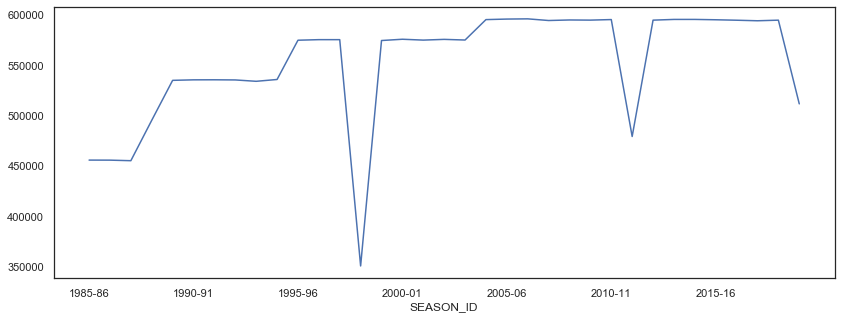

In [7]:
plt.figure(figsize=(14, 5))
min_by_season = (seasons
 .query('(SEASON_ID >= "1985-86")')
 .groupby(['SEASON_ID'])
 .total_min_in_season.first()
                )

min_by_season.plot()

event_map = {
 '1988-89': '+ Шарлотт и Майами',
 '1989-90': '+ Орландо и Миннесота',
 '1995-96': '+ Торонто и Ванкувер',
 '1998-99': 'Локаут',
 '2004-05': '+ Шарлотт (ещё раз)',
 '2011-12': 'Локаут',
 '2019-20': 'Локдаун'
}
min_by_season = min_by_season.reset_index()
min_by_season['event'] = min_by_season.SEASON_ID.map(event_map, na_action='ignore').fillna('')

In [8]:
min_by_season

,SEASON_ID,total_min_in_season,event
0,1985-86,455640.0,
1,1986-87,455590.0,
2,1987-88,455040.0,
3,1988-89,495150.0,+ Шарлотт и Майами
4,1989-90,534760.0,+ Орландо и Миннесота
5,1990-91,535260.0,
6,1991-92,535310.0,
7,1992-93,535160.0,
8,1993-94,533810.0,
9,1994-95,535610.0,


In [9]:
seasons.PLAYER_AGE.value_counts(dropna=False).sort_index().tail(20)

48.0     1
49.0     2
50.0     2
51.0     1
81.0     1
82.0     2
83.0     1
84.0     1
85.0     1
86.0     1
87.0     1
88.0     1
89.0     1
90.0     1
91.0     1
92.0     1
93.0     1
94.0     1
108.0    1
110.0    2
Name: PLAYER_AGE, dtype: int64

In [10]:
tt = alt.Chart(min_by_season, height=400, width=600)
lines = (tt
         .mark_line()
         .encode(x=alt.X('SEASON_ID:N', title='Сезон',
                         axis=alt.Axis(grid=True)), 
                 y=alt.Y('total_min_in_season', title='Сыграно минут за регулярный сезон', 
                         scale=alt.Scale(zero=False))
#                    color='full_name:N', 
                  )
        )

points = tt.mark_point(filled=True).encode(x='SEASON_ID:N', y='total_min_in_season', 
#                    color=alt.Color('full_name:N', legend=None), 
#                    size=alt.Size('FTA:Q', scale=alt.Scale(range=[50, 800]), 
#                                  title='Пробито штрафных', legend=alt.Legend(orient="left"))
                  )


text = tt.mark_text(
    angle=360-15,
    align='left',
    baseline='middle',
    dx=-7, 
    size=15
).encode(
    x='SEASON_ID:N', y='total_min_in_season', text='event'
)


(lines 
 + points 
 + text
).configure_axis(
    labelFontSize=15,
    titleFontSize=15
)


alt.LayerChart(...)

In [11]:
(seasons
 .query('(SEASON_ID >= "1985-86")')
 .query('TEAM_ID != 0')
 .groupby(['SEASON_ID', 'TEAM_ABBREVIATION'])
 .MIN.sum()
 .unstack(0)
 .count(axis=0)
#  .sort_values()
)

SEASON_ID
1985-86    23
1986-87    23
1987-88    23
1988-89    25
1989-90    27
1990-91    27
1991-92    27
1992-93    27
1993-94    27
1994-95    27
1995-96    29
1996-97    29
1997-98    29
1998-99    29
1999-00    29
2000-01    29
2001-02    29
2002-03    29
2003-04    29
2004-05    30
2005-06    30
2006-07    30
2007-08    30
2008-09    30
2009-10    30
2010-11    30
2011-12    30
2012-13    30
2013-14    30
2014-15    30
2015-16    30
2016-17    30
2017-18    30
2018-19    30
2019-20    30
dtype: int64

# join and fill na

In [12]:
df = pd.merge(seasons, info, left_on='PLAYER_ID', right_on='PERSON_ID')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13042 entries, 0 to 13041
Data columns (total 60 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   PLAYER_ID                         13042 non-null  object        
 1   SEASON_ID                         13042 non-null  object        
 2   LEAGUE_ID                         13042 non-null  object        
 3   TEAM_ID_x                         13042 non-null  object        
 4   TEAM_ABBREVIATION_x               13042 non-null  object        
 5   PLAYER_AGE                        13042 non-null  float64       
 6   GP                                13042 non-null  object        
 7   GS                                13042 non-null  object        
 8   MIN                               13042 non-null  object        
 9   FGM                               13042 non-null  object        
 10  FGA                               13042 non-nu

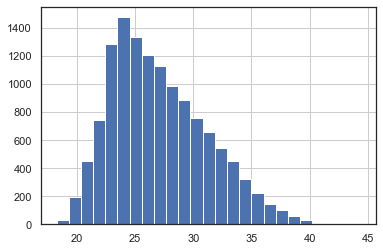

In [13]:
from functools import lru_cache

@lru_cache()
def mid_season(season):
    year = int(season.split('-')[0]) + 1
    return pd.to_datetime(f'{year}-02-01')

df['mid_season'] = df.SEASON_ID.map(mid_season)

df['calc_age'] = np.abs((df.mid_season - df.BIRTHDATE) / np.timedelta64(1, 'Y'))
df.calc_age.hist(bins=25)

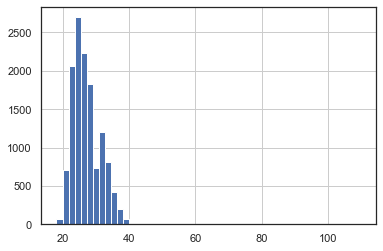

In [14]:
df.PLAYER_AGE.hist(bins=50)

In [15]:
info.WEIGHT.value_counts().sort_index().index[1]

' '

In [16]:
def feet2cm(feet_str):
    s = str(feet_str).split('-')
    if len(s) == 1:
        return np.NaN
    f, i = [int(sub) for sub in s]
    return (f*12 + i) * 2.54

def lbs2kg(lbs_val):
    if lbs_val in ['', ' ']:
        return np.NaN
    if pd.isna(lbs_val):
        return np.NaN
    return int(lbs_val) * 0.453

df['h'] = df.HEIGHT.map(feet2cm)
df['w'] = df.WEIGHT.map(lbs2kg)

In [17]:
for col in ['h', 'w']:
#     df.loc[df[col].isin(['', ' ']), col] = np.NaN
    print((df[col].isna()).sum())
    df[col].fillna(df.groupby(['SEASON_ID', 'POSITION'])[col].transform('median'), inplace=True)
    df[col].fillna(df.groupby(['SEASON_ID'])[col].transform('median'), inplace=True)
    print((df[col].isna()).sum())
    df[f'weighted_{col}'] = df[col] * df.MIN.fillna(0) / df.total_min_in_season

486
0
486
0


# age

In [18]:
seasons['weighted_age'] = seasons.PLAYER_AGE * seasons.MIN.fillna(0) / seasons.total_min_in_season
df['weighted_age'] = df.calc_age * df.MIN.fillna(0) / df.total_min_in_season

In [19]:
seasons[seasons.PLAYER_AGE > 42].sort_values('SEASON_ID')

,PLAYER_ID,SEASON_ID,LEAGUE_ID,TEAM_ID,TEAM_ABBREVIATION,PLAYER_AGE,GP,GS,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,total_min_in_season,weighted_age
0,76689,1947-48,00,1610610032,PRO,43.0,25,None,NaN,95,376,0.253,None,None,None,63,104,0.606,None,None,NaN,16,None,None,None,62,253,0.0,NaN
0,76769,1947-48,00,1610610024,BAL,43.0,5,None,None,1,9,0.111,None,None,None,3,6,0.5,None,None,None,3,None,None,None,8,5,0.0,NaN
0,77557,1947-48,00,1610610024,BAL,43.0,2,None,None,0,1,0,None,None,None,0,0,None,None,None,None,0,None,None,None,1,0,0.0,NaN
0,77016,1947-48,00,1610610032,PRO,46.0,1,None,None,0,6,0,None,None,None,2,3,0.667,None,None,None,0,None,None,None,5,2,0.0,NaN
0,77979,1948-49,00,1610610025,CHS,44.0,2,None,0,1,3,0.333,None,None,None,0,0,0,None,None,0,0,None,None,None,2,2,0.0,NaN
1,76689,1948-49,00,1610610032,PRO,44.0,11,None,0,16,73,0.219,None,None,None,21,25,0.84,None,None,0,11,None,None,None,13,53,0.0,NaN
2,76689,1948-49,00,1610610024,BAL,44.0,27,None,0,44,149,0.295,None,None,None,39,55,0.709,None,None,0,27,None,None,None,36,127,0.0,NaN
3,76689,1948-49,00,1610612738,BOS,44.0,18,None,0,68,185,0.368,None,None,None,49,80,0.613,None,None,0,29,None,None,None,49,185,0.0,NaN
1,77979,1948-49,00,1610612738,BOS,44.0,26,None,0,36,109,0.33,None,None,None,9,19,0.474,None,None,0,13,None,None,None,34,81,0.0,NaN
2,77979,1948-49,00,1610610034,BOM,44.0,22,None,0,52,155,0.335,None,None,None,35,44,0.795,None,None,0,28,None,None,None,77,139,0.0,NaN


https://www.nba.com/stats/player/201207/career/

In [20]:
def lower(s):
    return s.mean() - s.std()

def upper(s):
    return s.mean() + s.std()

plain_age = (df
#  .query('PLAYER_ID != 201207')
#  .query('PLAYER_ID != 100263')
 .query('(SEASON_ID >= "2000-01")')
 .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
 .agg({'PLAYER_AGE': ['mean', lower, upper]})
 .droplevel(0, axis=1)
 .rename(columns={'mean': 'PLAYER_AGE'})
 .reset_index()
             
            )
plain_age.head()

,SEASON_ID,PLAYER_AGE,lower,upper
0,2000-01,28.197959,23.747873,32.648045
1,2001-02,27.689362,23.095715,32.283009
2,2002-03,27.567982,23.075769,32.060196
3,2003-04,27.584139,23.256119,31.912160
4,2004-05,27.496198,23.118007,31.874389


In [21]:
tt = alt.Chart(plain_age, height=400, width=600)
lines = (tt
         .mark_line()
         .encode(x=alt.X('SEASON_ID:N', title='Сезон',
                         axis=alt.Axis(grid=True)), 
                 y=alt.Y('PLAYER_AGE', title='Средний возраст игроков', 
                         scale=alt.Scale(zero=False))
                  )
        )

points = tt.mark_point(filled=True).encode(x='SEASON_ID:N', y='PLAYER_AGE')

band = tt.mark_area(opacity=0.5).encode(x='SEASON_ID:N',
                                        y='lower',
                                        y2='upper')


(lines 
 + points 
 + band
).configure_axis(
    labelFontSize=15,
    titleFontSize=15
)

alt.LayerChart(...)

In [22]:
age_2 = (df
           .query('(SEASON_ID >= "2000-01")')
           .groupby(['SEASON_ID'])
           .agg({'calc_age': 'mean', 'weighted_age': 'sum'})
         .rename(columns={'calc_age': 'Простое среднее',
                          'weighted_age': 'Взвешенное среднее'})
         .reset_index()
         .melt(id_vars='SEASON_ID', 
#                value_vars=['calc_age', 'weighted_age'], 
               value_name='age')
            )

age_2.head()

,SEASON_ID,variable,age
0,2000-01,Простое среднее,28.292061
1,2001-02,Простое среднее,27.764993
2,2002-03,Простое среднее,27.653413
3,2003-04,Простое среднее,27.668441
4,2004-05,Простое среднее,27.575325


In [23]:
tt = alt.Chart(age_2, height=400, width=600)
lines = (tt
         .mark_line(point=True,  size=5)
         .encode(x=alt.X('SEASON_ID:N', title='Сезон',
                         axis=alt.Axis(grid=True)), 
                 y=alt.Y('age', title='Средний возраст игроков', 
                         scale=alt.Scale(zero=False)),
                 color=alt.Color('variable', title='Агрегация')
                )
        )



(lines 
).configure_axis(
    labelFontSize=15,
    titleFontSize=15
).configure_point(size=200)

alt.Chart(...)

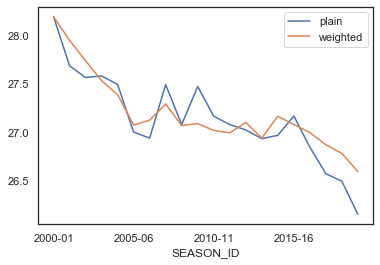

In [24]:
_ax = plt.gca()
(df
#  .query('PLAYER_ID != 201207')
 .query('(SEASON_ID >= "2000-01")')
 .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
 .PLAYER_AGE.mean()
#  .unstack(0)
#  .sort_values()
  .plot(label='plain', ax=_ax)
)

# (df
#  .query('PLAYER_ID != 201207')
#  .query('(SEASON_ID >= "2000-01")')
#  .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
#  .PLAYER_AGE.max()
# #  .unstack(0)
# #  .sort_values()
#   .plot(label='max', ax=_ax)
# )

# (df
# #  .query('PLAYER_ID != 201207')
#  .query('(SEASON_ID >= "2000-01")')
#  .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
#  .PLAYER_AGE.min()
# #  .unstack(0)
# #  .sort_values()
#   .plot(label='min', ax=_ax)
# )

(df
#  .query('PLAYER_ID != 201207')
 .query('(SEASON_ID >= "2000-01")')
 .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
 .weighted_age.sum()
#  .unstack(0)
#  .sort_values()
 .plot(label='weighted', ax=_ax)
)
_ax.legend()

In [25]:
df.SEASON_ID[df.MIN.isna()].value_counts()

Series([], Name: SEASON_ID, dtype: int64)

# height

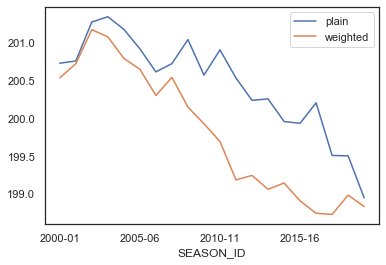

In [26]:
_ax = plt.gca()
(df
#  .query('PLAYER_ID != 201207')
 .query('(SEASON_ID >= "2000-01")')
 .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
 .h.mean()
#  .unstack(0)
#  .sort_values()
  .plot(label='plain', ax=_ax)
)

(df
#  .query('PLAYER_ID != 201207')
 .query('(SEASON_ID >= "2000-01")')
 .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
 .weighted_h.sum()
#  .unstack(0)
#  .sort_values()
 .plot(label='weighted', ax=_ax)
)
_ax.legend()

In [27]:
height = (df
           .query('(SEASON_ID >= "2000-01")')
           .groupby(['SEASON_ID'])
           .agg({'h': 'mean', 'weighted_h': 'sum'})
         .rename(columns={'h': 'Простое среднее',
                          'weighted_h': 'Взвешенное среднее'})
         .reset_index()
         .melt(id_vars='SEASON_ID', 
#                value_vars=['calc_age', 'weighted_age'], 
               value_name='height')
            )

height.head()

,SEASON_ID,variable,height
0,2000-01,Простое среднее,200.732571
1,2001-02,Простое среднее,200.762681
2,2002-03,Простое среднее,201.278289
3,2003-04,Простое среднее,201.347814
4,2004-05,Простое среднее,201.181521


In [28]:
tt = alt.Chart(height, height=400, width=600)
lines = (tt
         .mark_line(point=True,  size=5)
         .encode(x=alt.X('SEASON_ID:N', title='Сезон',
                         axis=alt.Axis(grid=True)), 
                 y=alt.Y('height', title='Средний рост игроков (см)', 
                         scale=alt.Scale(zero=False)),
                 color=alt.Color('variable', title='Агрегация')
                )
        )



(lines 
).configure_axis(
    labelFontSize=15,
    titleFontSize=15
).configure_point(size=200)

alt.Chart(...)

In [44]:
tt = alt.Chart(height, height=200, width=600)
lines = (tt
         .mark_line(point=True,  size=5)
         .encode(x=alt.X('SEASON_ID:N', title='Сезон',
                         axis=alt.Axis(grid=True)), 
                 y=alt.Y('height', title='Средний рост игроков (см)', 
                         scale=alt.Scale(zero=True)),
                 color=alt.Color('variable', title='Агрегация')
                )
        )



(lines 
).configure_axis(
    labelFontSize=15,
    titleFontSize=15
).configure_point(size=200)

alt.Chart(...)

In [32]:
def lower(s):
    return s.mean() - s.std()

def upper(s):
    return s.mean() + s.std()

plain_ = (df
#  .query('PLAYER_ID != 201207')
#  .query('PLAYER_ID != 100263')
 .query('(SEASON_ID >= "2000-01")')
 .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
 .agg({'h': ['mean', lower, upper]})
 .droplevel(0, axis=1)
 .rename(columns={'mean': 'height'})
 .reset_index()
             
            )
plain_.head()

,SEASON_ID,height,lower,upper
0,2000-01,200.732571,191.179192,210.285950
1,2001-02,200.762681,191.119327,210.406034
2,2002-03,201.278289,191.793910,210.762669
3,2003-04,201.347814,191.770557,210.925072
4,2004-05,201.181521,191.559599,210.803443


In [33]:
tt = alt.Chart(plain_, height=400, width=600)
lines = (tt
         .mark_line(point=True)
         .encode(x=alt.X('SEASON_ID:N', title='Сезон',
                         axis=alt.Axis(grid=True)), 
                 y=alt.Y('height', title='Средний рост игроков', 
                         scale=alt.Scale(zero=False))
                  )
        )

band = tt.mark_area(opacity=0.5).encode(x='SEASON_ID:N',
                                        y='lower',
                                        y2='upper')


(lines  
 + band
).configure_axis(
    labelFontSize=15,
    titleFontSize=15
)

alt.LayerChart(...)

In [34]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [35]:
tt = alt.Chart(df.query('(SEASON_ID >= "2000-01")'), height=400, width=600)
lines = (tt
         .mark_boxplot()
         .encode(x=alt.X('SEASON_ID:N', title='Сезон',
                         axis=alt.Axis(grid=True)), 
                 y=alt.Y('h', title='рост игроков', 
                         scale=alt.Scale(zero=False))
                  )
        )

# band = tt.mark_area(opacity=0.5).encode(x='SEASON_ID:N',
#                                         y='lower',
#                                         y2='upper')


(lines  
#  + band
).configure_axis(
    labelFontSize=15,
    titleFontSize=15
)

alt.Chart(...)

In [36]:
df.groupby('PLAYER_SLUG').h.first().reset_index().sort_values('h').iloc[np.r_[0:4, -4:0]]

,PLAYER_SLUG,h
573,earl-boykins,165.10
290,chris-clemons,175.26
756,isaiah-thomas,175.26
1935,yuta-tabuse,175.26
1476,pavel-podkolzin,226.06
1727,tacko-fall,226.06
1357,ming-yao,228.60
1678,shawn-bradley,228.60


In [37]:
info[(info.HEIGHT.str.len() > 2) & ((info.HEIGHT > '7-3') | (info.HEIGHT < '5-11'))].sort_values('HEIGHT')

,PERSON_ID,FIRST_NAME,LAST_NAME,DISPLAY_FIRST_LAST,DISPLAY_LAST_COMMA_FIRST,DISPLAY_FI_LAST,PLAYER_SLUG,BIRTHDATE,SCHOOL,COUNTRY,LAST_AFFILIATION,HEIGHT,WEIGHT,SEASON_EXP,JERSEY,POSITION,ROSTERSTATUS,GAMES_PLAYED_CURRENT_SEASON_FLAG,TEAM_ID,TEAM_NAME,TEAM_ABBREVIATION,TEAM_CODE,TEAM_CITY,PLAYERCODE,FROM_YEAR,TO_YEAR,DLEAGUE_FLAG,NBA_FLAG,GAMES_PLAYED_FLAG,DRAFT_YEAR,DRAFT_ROUND,DRAFT_NUMBER
0,721,Tyus,Edney,Tyus Edney,"Edney, Tyus",T. Edney,tyus-edney,1973-02-14,UCLA,USA,UCLA/USA,5-10,166,3,2,Guard,Inactive,N,1610612758,Kings,SAC,kings,Sacramento,tyus_edney,1995,2000,N,Y,Y,1995,2,47
0,1627755,Tyler,Ulis,Tyler Ulis,"Ulis, Tyler",T. Ulis,tyler-ulis,1996-01-05,Kentucky,USA,Kentucky/USA,5-10,160,3,,Guard,Inactive,N,0,,,,,tyler_ulis,2016,2018,Y,Y,Y,2016,2,34
0,203510,Pierre,Jackson,Pierre Jackson,"Jackson, Pierre",P. Jackson,pierre-jackson,1991-08-29,Baylor,USA,Baylor/USA,5-10,180,0,,Guard,Inactive,N,0,,,,,pierre_jackson,2016,2016,Y,Y,Y,2013,2,42
0,201291,Carldell,Johnson,Carldell Johnson,"Johnson, Carldell",C. Johnson,carldell-johnson,1983-01-28,Alabama-Birmingham,USA,Alabama-Birmingham/USA,5-10,180,1,,Guard,Inactive,N,0,,,,,carldell_johnson,2011,2011,Y,Y,Y,Undrafted,Undrafted,Undrafted
0,200826,J.J.,Barea,J.J. Barea,"Barea, J.J.",J. Barea,jj-barea,1984-06-26,Northeastern,Puerto Rico,Northeastern/Puerto Rico,5-10,180,14,5,Guard,Inactive,N,1610612742,Mavericks,DAL,mavericks,Dallas,j.j._barea,2006,2019,Y,Y,Y,Undrafted,Undrafted,Undrafted
0,2857,Andre,Barrett,Andre Barrett,"Barrett, Andre",A. Barrett,andre-barrett,1982-02-21,Seton Hall,USA,Seton Hall/USA,5-10,173,4,,Guard,Inactive,N,0,,,,,andre_barrett,2004,2007,Y,Y,Y,Undrafted,Undrafted,Undrafted
0,1629607,Jared,Harper,Jared Harper,"Harper, Jared",J. Harper,jared-harper,1997-09-14,Auburn,USA,Auburn/USA,5-10,175,1,0,Guard,Active,Y,1610612752,Knicks,NYK,knicks,New York,jared_harper,2019,2020,Y,Y,Y,Undrafted,Undrafted,Undrafted
0,1629682,Tremont,Waters,Tremont Waters,"Waters, Tremont",T. Waters,tremont-waters,1998-01-10,Louisiana State,USA,Louisiana State/USA,5-10,175,1,51,Guard,Active,Y,1610612738,Celtics,BOS,celtics,Boston,tremont_waters,2019,2020,Y,Y,Y,2019,2,51
0,2366,Mike,Wilks,Mike Wilks,"Wilks, Mike",M. Wilks,mike-wilks,1979-05-07,Rice,USA,Rice/USA,5-10,180,7,,Guard,Inactive,N,0,,,,,mike_wilks,2002,2009,N,Y,Y,Undrafted,Undrafted,Undrafted
0,2064,Khalid,El-Amin,Khalid El-Amin,"El-Amin, Khalid",K. El-Amin,khalid-el-amin,1979-04-25,Connecticut,USA,Connecticut/USA,5-10,200,1,11,Guard,Inactive,N,1610612741,Bulls,CHI,bulls,Chicago,khalid_el-amin,2000,2002,N,Y,Y,2000,2,34


# weight

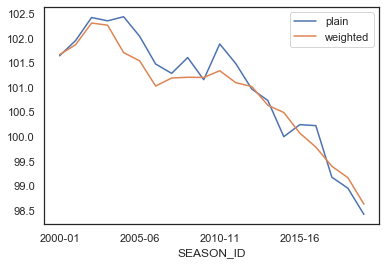

In [38]:
_ax = plt.gca()
(df
#  .query('PLAYER_ID != 201207')
 .query('(SEASON_ID >= "2000-01")')
 .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
 .w.mean()
#  .unstack(0)
#  .sort_values()
  .plot(label='plain', ax=_ax)
)

(df
#  .query('PLAYER_ID != 201207')
 .query('(SEASON_ID >= "2000-01")')
 .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
 .weighted_w.sum()
#  .unstack(0)
#  .sort_values()
 .plot(label='weighted', ax=_ax)
)
_ax.legend()

In [39]:
df.columns

Index(['PLAYER_ID', 'SEASON_ID', 'LEAGUE_ID', 'TEAM_ID_x',
       'TEAM_ABBREVIATION_x', 'PLAYER_AGE', 'GP', 'GS', 'MIN', 'FGM', 'FGA',
       'FG_PCT', 'FG3M', 'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB',
       'DREB', 'REB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS',
       'total_min_in_season', 'PERSON_ID', 'FIRST_NAME', 'LAST_NAME',
       'DISPLAY_FIRST_LAST', 'DISPLAY_LAST_COMMA_FIRST', 'DISPLAY_FI_LAST',
       'PLAYER_SLUG', 'BIRTHDATE', 'SCHOOL', 'COUNTRY', 'LAST_AFFILIATION',
       'HEIGHT', 'WEIGHT', 'SEASON_EXP', 'JERSEY', 'POSITION', 'ROSTERSTATUS',
       'GAMES_PLAYED_CURRENT_SEASON_FLAG', 'TEAM_ID_y', 'TEAM_NAME',
       'TEAM_ABBREVIATION_y', 'TEAM_CODE', 'TEAM_CITY', 'PLAYERCODE',
       'FROM_YEAR', 'TO_YEAR', 'DLEAGUE_FLAG', 'NBA_FLAG', 'GAMES_PLAYED_FLAG',
       'DRAFT_YEAR', 'DRAFT_ROUND', 'DRAFT_NUMBER', 'mid_season', 'calc_age',
       'h', 'w', 'weighted_h', 'weighted_w', 'weighted_age'],
      dtype='object')

In [40]:
df.MIN = df.MIN.astype(float)
df['weighted_min'] = df.MIN / df.total_min_in_season
df['mpg'] = df.MIN / df.GP.astype(float)

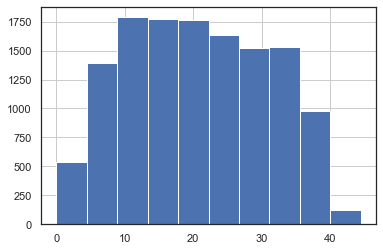

In [41]:
(df.mpg).hist()

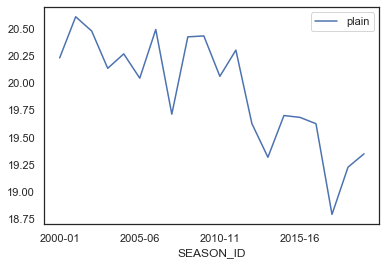

In [42]:
_ax = plt.gca()
(df
#  .query('PLAYER_ID != 201207')
 .query('(SEASON_ID >= "2000-01")')
 .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
 .mpg.mean()
#  .unstack(0)
#  .sort_values()
  .plot(label='plain', ax=_ax)
)

# (df
# #  .query('PLAYER_ID != 201207')
#  .query('(SEASON_ID >= "2000-01")')
#  .groupby(['SEASON_ID']) #, 'TEAM_ABBREVIATION'])
#  .weighted_min.sum()
# #  .unstack(0)
# #  .sort_values()
#  .plot(label='weighted', ax=_ax)
# )
_ax.legend()

In [43]:
info[info.LAST_NAME.str.lower().str.contains('tat')]

,PERSON_ID,FIRST_NAME,LAST_NAME,DISPLAY_FIRST_LAST,DISPLAY_LAST_COMMA_FIRST,DISPLAY_FI_LAST,PLAYER_SLUG,BIRTHDATE,SCHOOL,COUNTRY,LAST_AFFILIATION,HEIGHT,WEIGHT,SEASON_EXP,JERSEY,POSITION,ROSTERSTATUS,GAMES_PLAYED_CURRENT_SEASON_FLAG,TEAM_ID,TEAM_NAME,TEAM_ABBREVIATION,TEAM_CODE,TEAM_CITY,PLAYERCODE,FROM_YEAR,TO_YEAR,DLEAGUE_FLAG,NBA_FLAG,GAMES_PLAYED_FLAG,DRAFT_YEAR,DRAFT_ROUND,DRAFT_NUMBER
0,1628369,Jayson,Tatum,Jayson Tatum,"Tatum, Jayson",J. Tatum,jayson-tatum,1998-03-03,Duke,USA,Duke/USA,6-8,210,3,0,Forward-Guard,Active,Y,1610612738,Celtics,BOS,celtics,Boston,jayson_tatum,2017,2020,N,Y,Y,2017,1,3
